<a href="https://colab.research.google.com/github/Jingsai/CMPT300G/blob/master/project/Project_Step3_Augmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Teams

- Team 1: Omar and William and Tim 
- Team 2: Yuhao and Connor and John Foley
- Team 3: John Mohr and Taylor and Jasper
- Team 4: Valeria and Julia 

## Model Tips

1. By examing the curve between mAP and epochs showing on TensorBoard, you may only run 20 epochs instead of 100 or even more epochs. 

<img src="https://cs.westminstercollege.edu/~jingsai/courses/CMPT300G/img/metrics.png">

2. We do not actually testing set in previous steps. The folder `test_pelican` or `val_pelican` serves as validation set in the training. You can create a testing set on your own and add one more line in .ymal file to include the path to test folder if you need. 

3. In training, the --img should be a multiple of 32, like 960, 1280. You can use 640 if only large objects are presented in images and 1280 if there are many small objects since you need high resolution images. 

4. img and batch size cannot set to large vaues that exceeds the memory limit of your machine. Though, in general, larger value of img or batch is better. 

5. In yaml file, the training path needs to be **customized** when incuding more than one folder like training folder and augmentation folder.    
  ```
  train: [/content/drive/MyDrive/pelican/train_pelican/images, /content/drive/MyDrive/pelican/augmentation/various/images] # train images 

  ```

  An example yaml file with multiple training folders can be downloaded from [link](https://cs.westminstercollege.edu/~jingsai/courses/CMPT300G/project/data_various.yaml)

6. You should not augment images validation or tetsing set, sicne we evaluate various model on same validation set. 



## Augmentation

## Code

Install newest version of albumentations with opencv.

In [ ]:
!pip install -U albumentations # upgrade from 0.1.12 to current 1.1.0
!pip install opencv-python-headless==4.1.2.30 # match opencv-python 4.1.2.30

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 102 kB 7.7 MB/s 
     |████████████████████████████████| 47.8 MB 69 kB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.8 MB 81.9 MB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.5.5.64
    Uninstalling opencv-python-headless-4.5.5.64:
      Successfully uninstalled opencv-python-headless-4.5.5.64


In [ ]:
import cv2
import albumentations as A
import matplotlib.pyplot as plt
import numpy as np
import os
import random

In [ ]:
A.__version__ # make sure the version is 1.1.0

'1.1.0'

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
project_path = '/content/drive/MyDrive/pelican/'

# list names of images and labels
image_list = os.listdir(project_path + 'train_pelican/' + 'images')
label_list = os.listdir(project_path + 'train_pelican/' + 'labels')

# Define a group of transformations. 
# horizontal flipping with probability 1
# brightness and contrast with limits 0.5
# hue, sat, and val with limits
# horizontal flipping and followed by a rotation with limit 20
transforms = [A.Compose( [A.HorizontalFlip(p=1)], 
                        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])),
              A.Compose( [A.RandomBrightnessContrast(brightness_limit=0.5, contrast_limit=0.5, p=1)], 
                        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])),
              A.Compose( [A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=1)], 
                        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])),
              A.Compose( [A.HorizontalFlip(p=1), A.Rotate(limit=20, p=1)], 
                        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])),]

In [ ]:
# load image data and boxes from one image
image = plt.imread('/content/drive/MyDrive/pelican/train_pelican/images/I_00021a.sd-g.JPG')
boxes = np.loadtxt('/content/drive/MyDrive/pelican/train_pelican/labels/I_00021a.sd-g.txt')

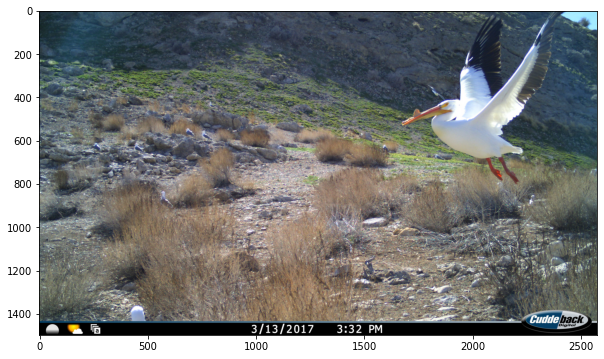

In [ ]:
# show the original image
plt.rcParams["figure.figsize"] = (10,6)
plt.imshow(image)

In [ ]:
# apply one transformation
transformed = transforms[2](image=image, bboxes=boxes[:,1:], class_labels = boxes[:,0])

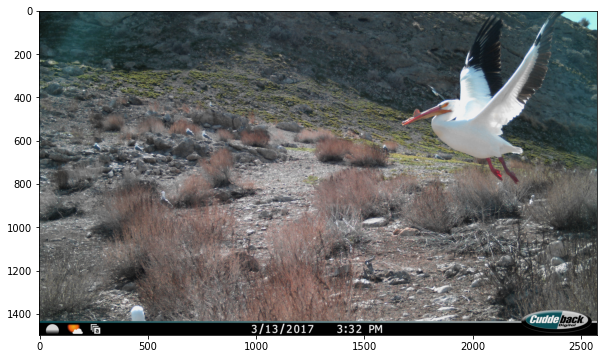

In [ ]:
# show the new image
plt.imshow(transformed['image'])

In [ ]:
boxes

array([[1.      , 0.23059 , 0.584225, 0.028727, 0.05615 ],
       [2.      , 0.785908, 0.273061, 0.278339, 0.531417],
       [1.      , 0.269992, 0.375334, 0.018245, 0.028743],
       [1.      , 0.300466, 0.386364, 0.018634, 0.034759]])

In [ ]:
transformed['bboxes']

[(0.7091552071514909,
  0.8042908029323754,
  0.04115946377957891,
  0.07333539562287272),
 (0.31786342858893035,
  0.2038188345926217,
  0.39514274875297023,
  0.4076376691852434),
 (0.7354795474476814,
  0.5893861069089532,
  0.024137858302653026,
  0.040578898487895754),
 (0.7058693093020847,
  0.5727866722707906,
  0.026216884619811864,
  0.046127875940702)]

In [ ]:
transformed['class_labels']

[1.0, 2.0, 1.0, 1.0]

In [ ]:
annotation = np.hstack([np.array(transformed['class_labels']).reshape(-1,1), transformed['bboxes']])

In [ ]:
# save image data and boxes
plt.imsave(project_path + '/augmentation/images/' + image_name, transformed['image'])
np.savetxt(project_path + '/augmentation/labels/' + label_name, annotation, fmt= '%d ' + '%.6f '*4)

### pseudo code

In [ ]:
for image_name in image_list:
  label_name = os.path.splitext(image_name)[0] + '.txt'
  if label_name in label_list:
    # define path to image and label

    # read image data and label

    # transform the data using a random augmentation or one augmentation 

    # save the data back to google drive 
    

### Demo results.

train on various augmentations. 

In [ ]:
!python train.py --img 960 --batch 20 --epochs 20 --data '/content/drive/MyDrive/pelican/data_various.yaml' --weights yolov5m.pt --cache 

train: weights=yolov5m.pt, cfg=, data=/content/drive/MyDrive/pelican/data_various.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=20, imgsz=960, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=

train without augmentations. 

In [ ]:
!python train.py --img 960 --batch 20 --epochs 20 --data '/content/drive/MyDrive/pelican/data.yaml' --weights yolov5m.pt --cache 

train: weights=yolov5m.pt, cfg=, data=/content/drive/MyDrive/pelican/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=20, imgsz=960, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

train on flipping augmentation. 

In [ ]:
!python train.py --img 960 --batch 20 --epochs 20 --data '/content/drive/MyDrive/pelican/data_hflip.yaml' --weights yolov5m.pt --cache 

train: weights=yolov5m.pt, cfg=, data=/content/drive/MyDrive/pelican/data_hflip.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=20, imgsz=960, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1889), started 0:34:46 ago. (Use '!kill 1889' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!python val.py --weights runs/train/exp/weights/best.pt --data '/content/drive/MyDrive/pelican/data_various.yaml' --img 960

val: data=/content/drive/MyDrive/pelican/data_various.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=960, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
val: Scanning '/content/drive/MyDrive/pelican/validation_pelican/labels.cache' images and labels... 102 found, 0 missing, 0 empty, 0 corrupt: 100% 102/102 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:12<00:00,  3.08s/it]
                 all        102        943      0.772      0.618      0.723       0.44
              flying        102         61      0.6

In [ ]:
!python val.py --weights runs/train/exp2/weights/best.pt --data '/content/drive/MyDrive/pelican/data.yaml' --img 960

val: data=/content/drive/MyDrive/pelican/data.yaml, weights=['runs/train/exp2/weights/best.pt'], batch_size=32, imgsz=960, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
val: Scanning '/content/drive/MyDrive/pelican/validation_pelican/labels.cache' images and labels... 102 found, 0 missing, 0 empty, 0 corrupt: 100% 102/102 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:12<00:00,  3.14s/it]
                 all        102        943      0.796      0.613      0.723      0.449
              flying        102         61      0.762     

In [ ]:
!python val.py --weights runs/train/exp3/weights/best.pt --data '/content/drive/MyDrive/pelican/data_hflip.yaml' --img 960

val: data=/content/drive/MyDrive/pelican/data_hflip.yaml, weights=['runs/train/exp3/weights/best.pt'], batch_size=32, imgsz=960, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
val: Scanning '/content/drive/MyDrive/pelican/validation_pelican/labels.cache' images and labels... 102 found, 0 missing, 0 empty, 0 corrupt: 100% 102/102 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:12<00:00,  3.24s/it]
                 all        102        943      0.734      0.633      0.711      0.446
              flying        102         61      0.60

In [ ]:
!python detect.py --source /content/drive/MyDrive/pelican/validation_pelican/images --weights runs/train/exp/weights/best.pt --img 960


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/pelican/validation_pelican/images, data=data/coco128.yaml, imgsz=[960, 960], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-230-gbf1a6dd Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
image 1/102 /content/drive/.shortcut-targets-by-id/1b3o8IX-65Ttb2cQsVh7OQUOSPKATm1rO/pelican/validation_pelican/images/I_00100a.sd-g.JPG: 576x960 5 no_beaks, 2 beaks, Done. (0.016s)
image 2/102 /content/drive/.shortcut-targets-by-id/1b3o8IX-65Ttb2cQsVh7OQUOSPKATm1rO/pelican/validation_pelican/images/I_00100b.

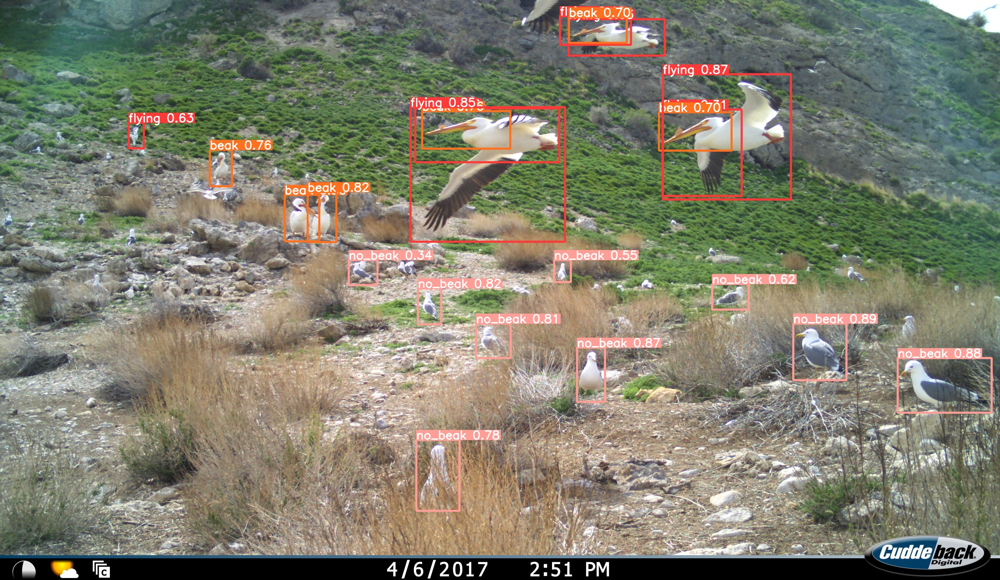

In [ ]:
Image(filename='runs/detect/exp2/I_00319c.sd-g.JPG', width=1200)

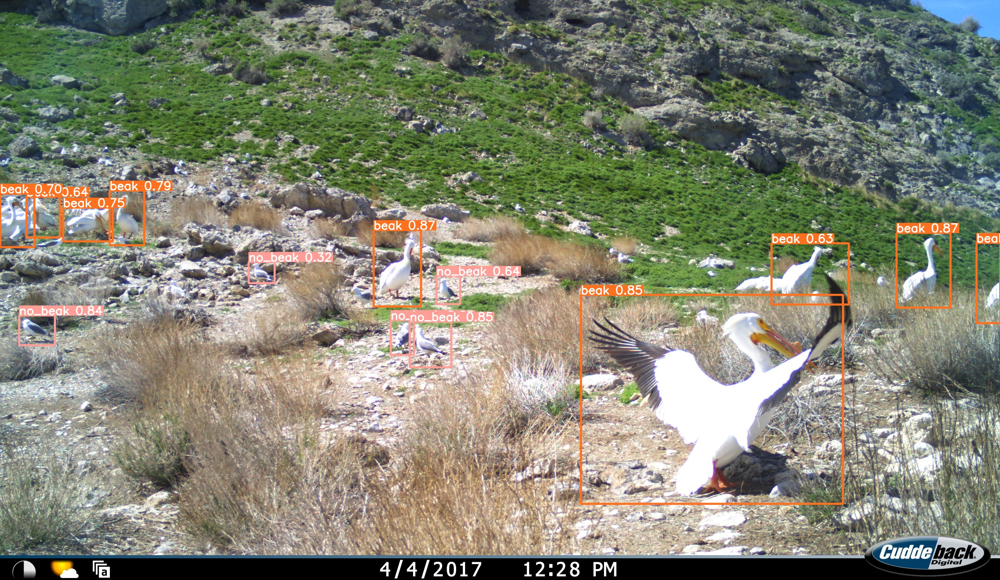

In [ ]:
Image(filename='runs/detect/exp2/I_00237a.sd-g.JPG', width=1000)

## Submission

Implement YOLO model **after** applying augmentation and submit your project notebook .ipynb file to Canvas by 6/1. 